1/1 [==============================] - 0s 106ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_13880\1661945524.py:53: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()


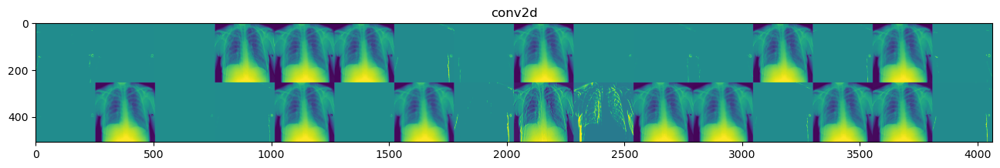

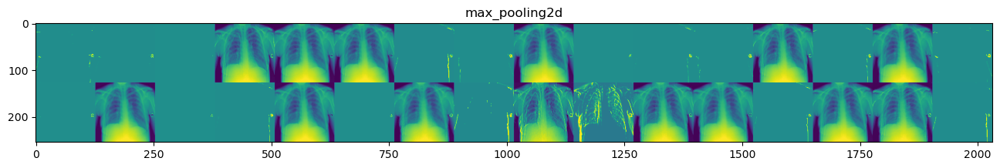

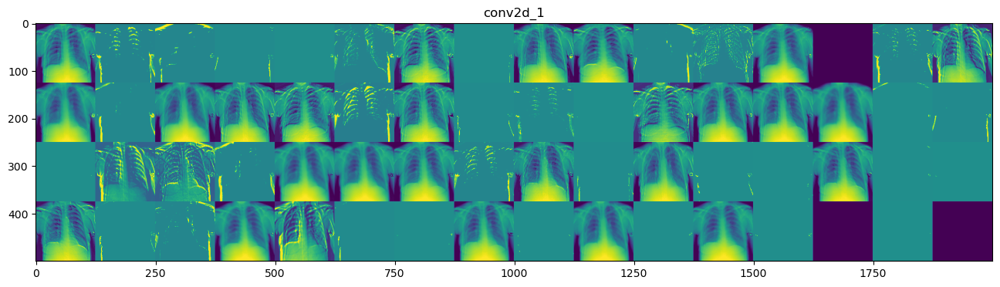

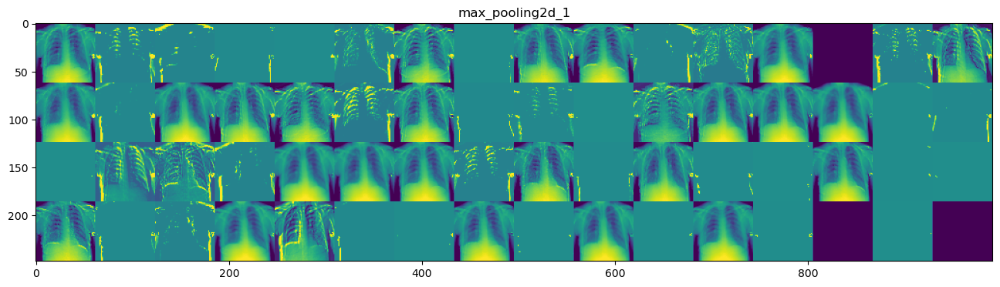

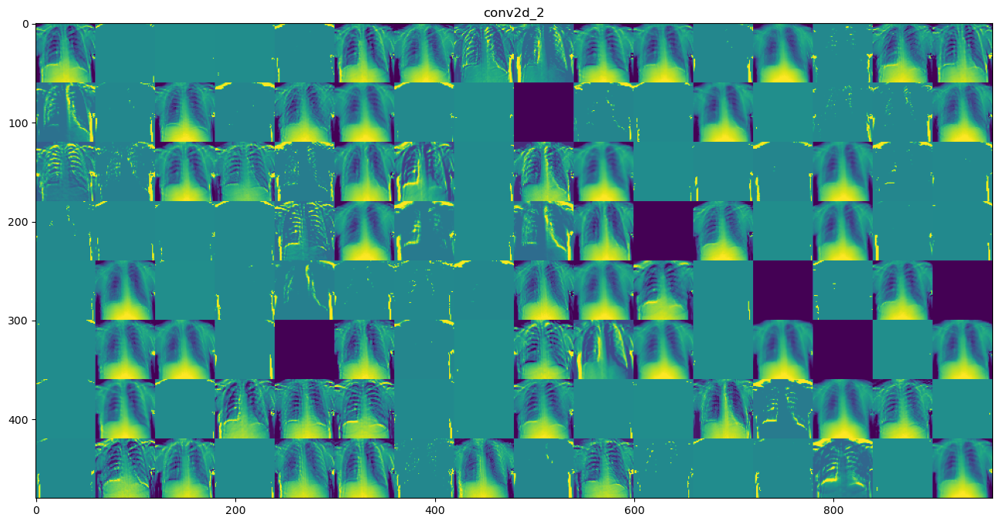

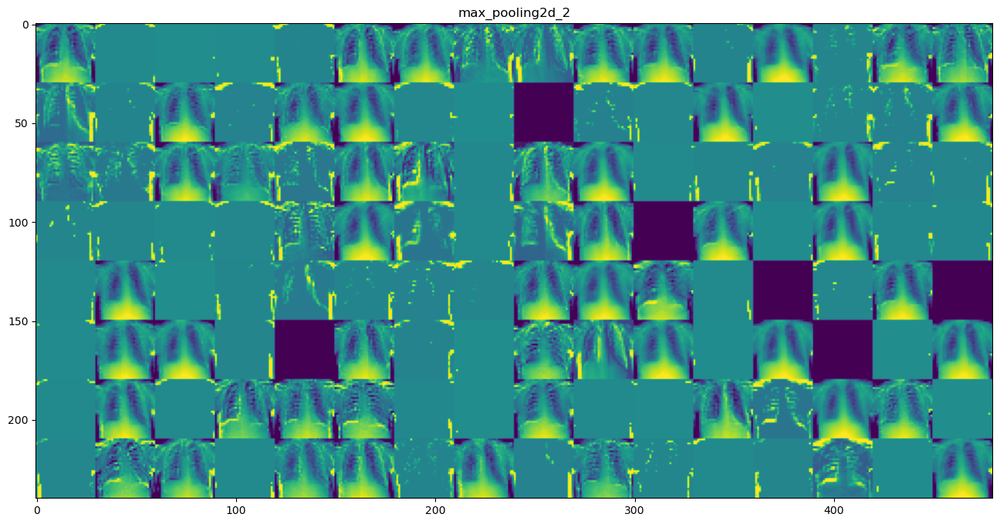

In [1]:
from tensorflow import keras
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np

# Define the CNN model architecture
model = models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Flatten(),
    layers.Dense(units=128, activation='relu'),
    layers.Dense(units=1, activation='sigmoid')
])

# Compile the model with binary cross-entropy loss and Adam optimizer
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Load a sample image
image = keras.preprocessing.image.load_img('Normal-1.png', target_size=(256, 256))

# Convert the image to a NumPy array and scale the pixel values to [0, 1]
image_array = keras.preprocessing.image.img_to_array(image) / 255.0

# Reshape the image array to match the input shape of the CNN model
image_array = image_array.reshape((1, 256, 256, 3))

# Define a new model to output the feature maps at each layer
layer_outputs = [layer.output for layer in model.layers[:6]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# Get the feature maps for the input image
activations = activation_model.predict(image_array)

# Plot the feature maps for each layer
layer_names = []
for layer in model.layers[:6]:
    layer_names.append(layer.name)

images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [4]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from keras_vis.utils import utils
from keras_vis.visualization import visualize_activation

# Load the trained CNN model
model = load_model("C:\\Users\\ASUS\\Desktop\\trying new uml\\my_model.h5")

# Load an example image to visualize the feature maps
img_path = 'Normal-1.png'
img = image.load_img(img_path, target_size=(256, 256))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)
x /= 255.0

# Choose a layer to visualize the feature maps
layer_idx = utils.find_layer_idx(model, 'conv2d_1')

# Use the GradCAM technique to generate a heatmap of the feature maps
heatmap = visualize_activation(model, layer_idx, filter_indices=None, seed_input=x, 
                               backprop_modifier='guided', grad_modifier='relu')

# Display the original image and the heatmap overlay
import matplotlib.pyplot as plt
plt.imshow(img)
plt.imshow(heatmap[0], cmap='jet', alpha=0.5)

ModuleNotFoundError: No module named 'keras_vis'

1/1 [==============================] - 0s 132ms/step


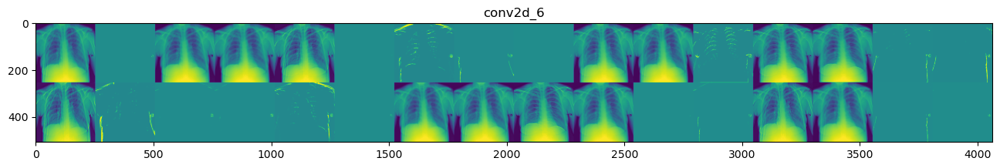

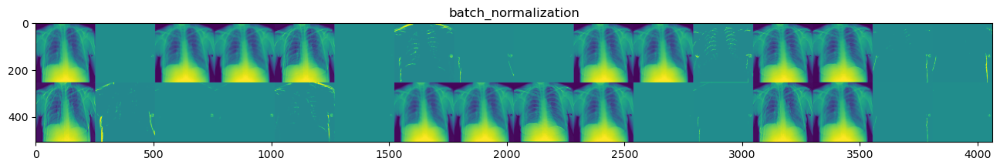

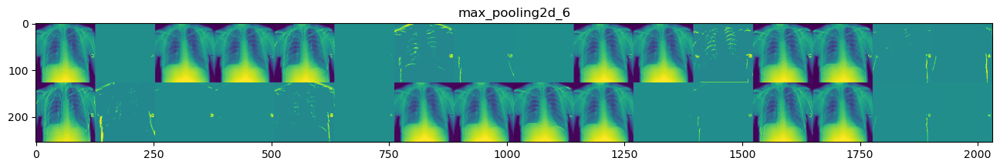

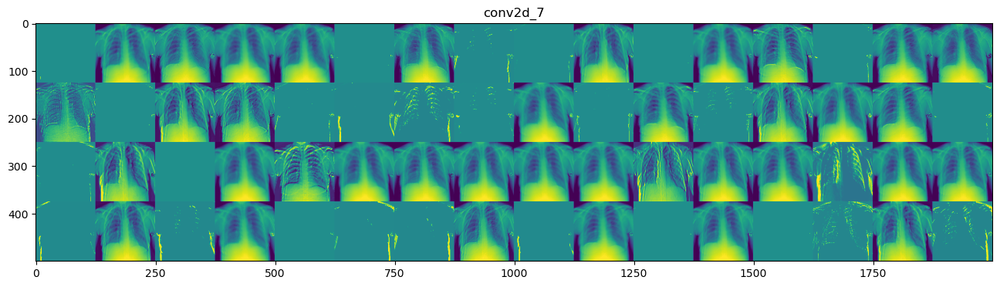

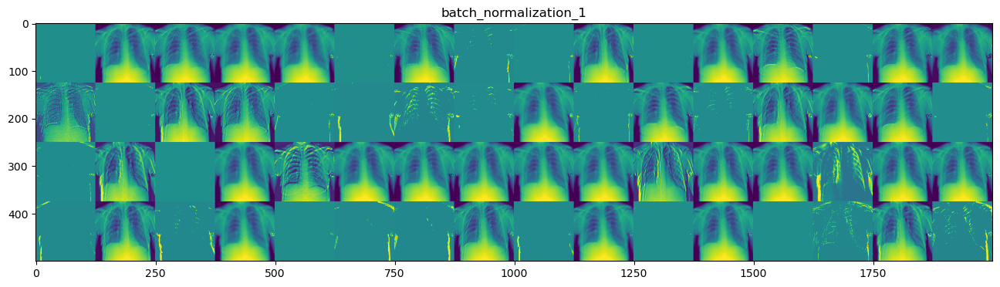

...

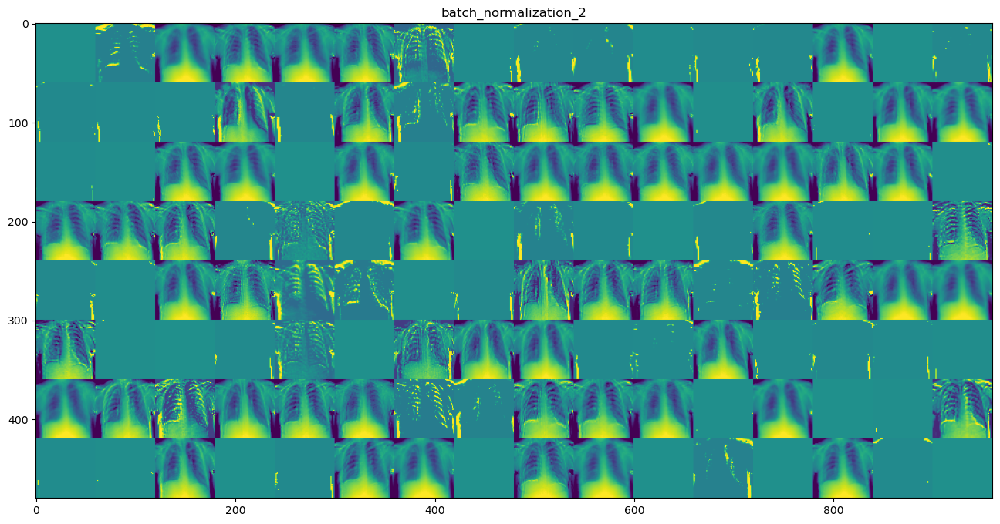

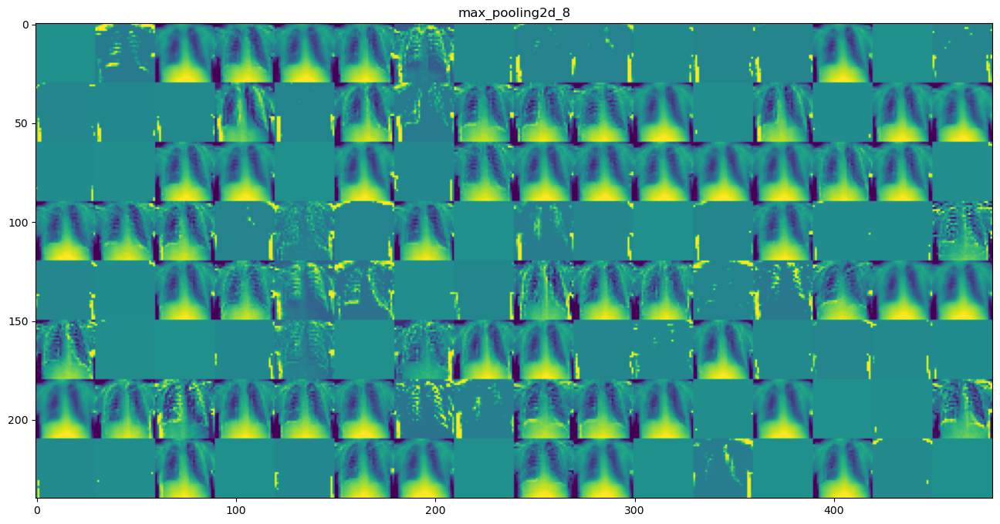

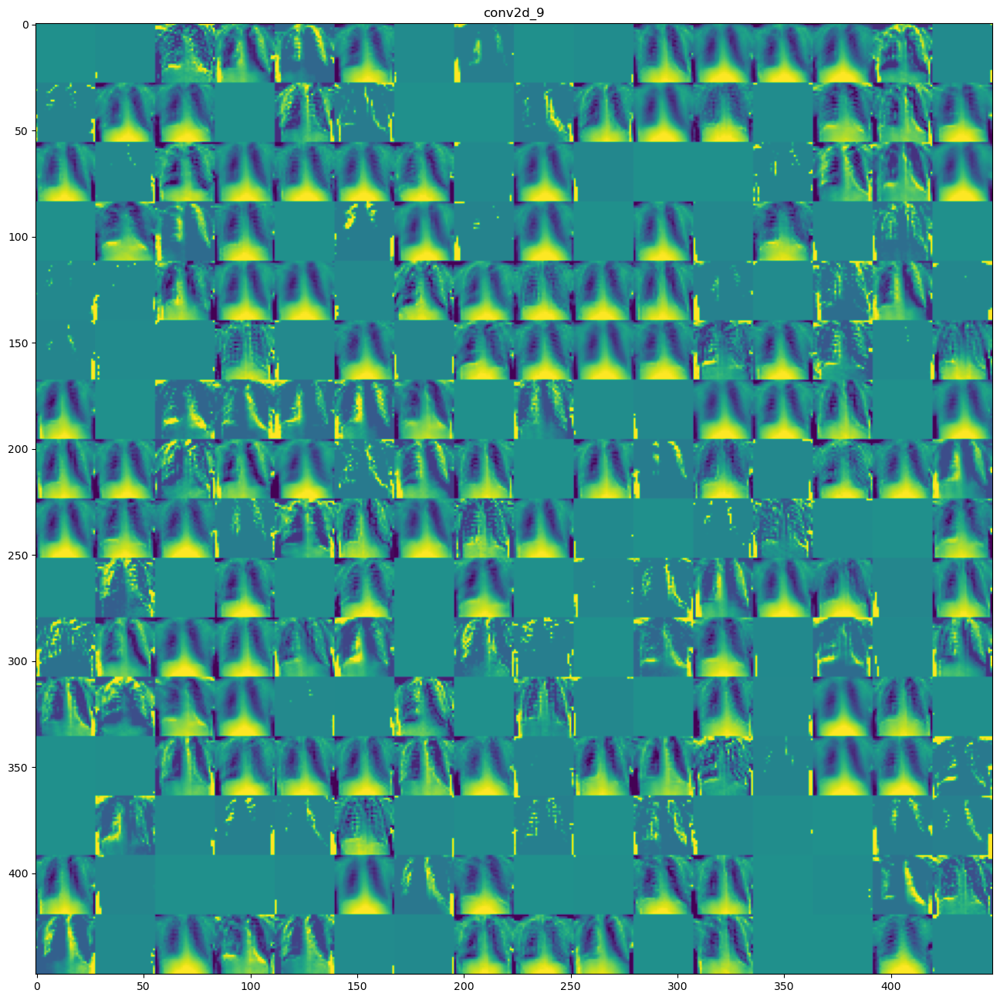

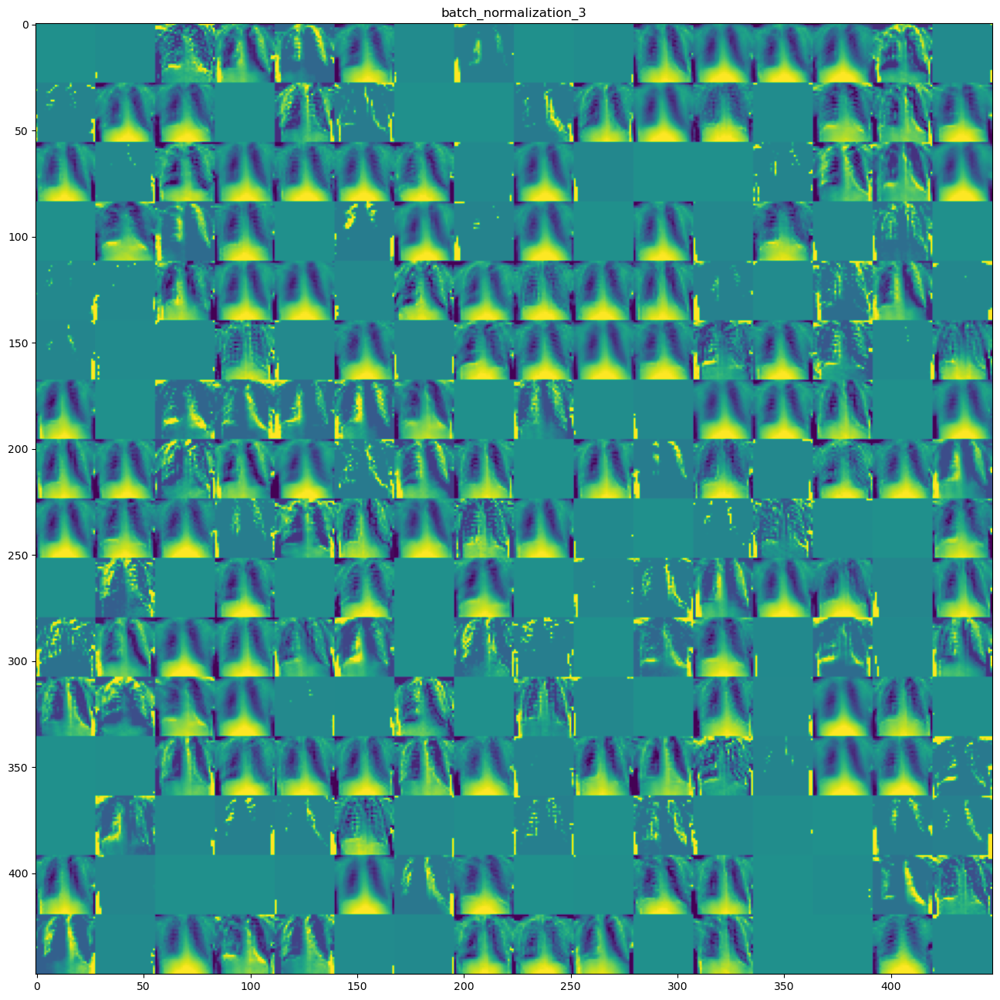

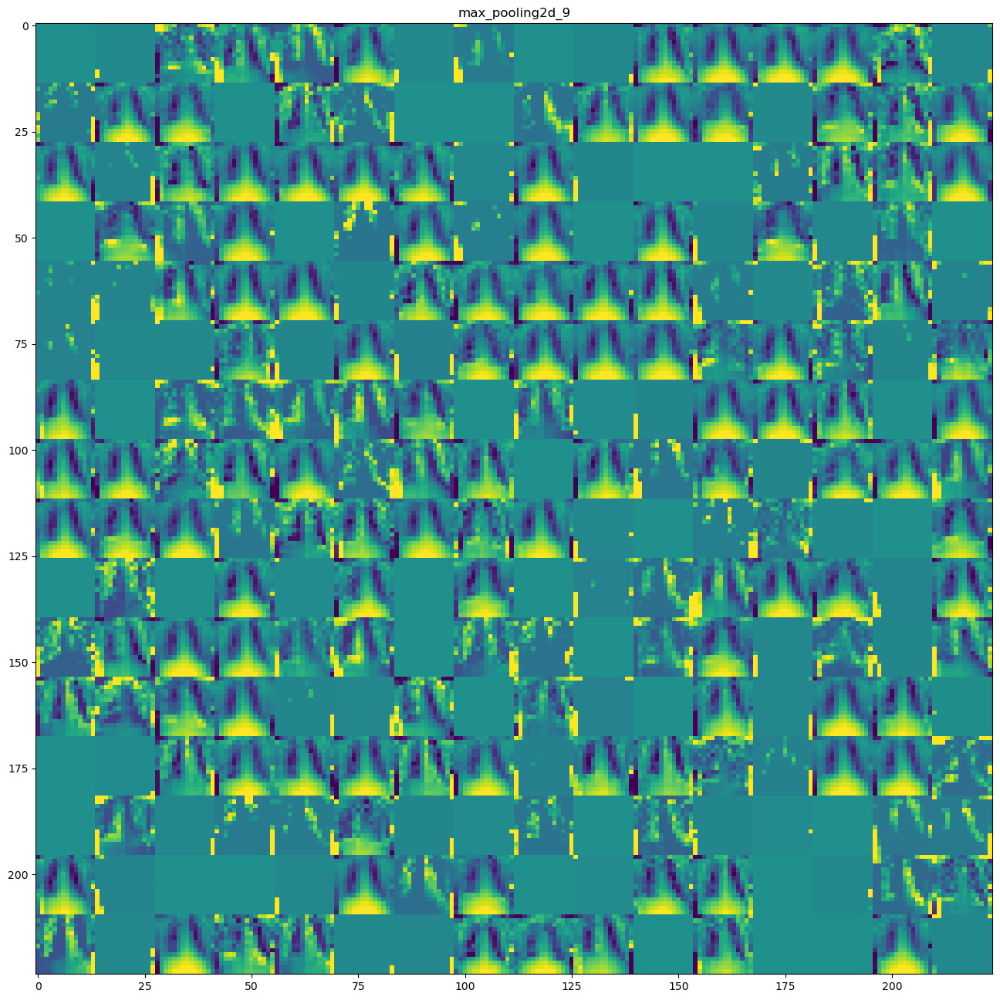

In [8]:
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
import matplotlib.pyplot as plt
import numpy as np

# Define the CNN model architecture with regularization and more layers
model = models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(filters=256, kernel_size=(3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(filters=512, kernel_size=(3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Flatten(),
    layers.Dense(units=512, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(units=128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(units=1, activation='sigmoid')
])

# Compile the model with binary cross-entropy loss and Adam optimizer
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Load a sample image
image = keras.preprocessing.image.load_img('Normal-1.png', target_size=(256, 256))
image_array = keras.preprocessing.image.img_to_array(image) / 255.0

image_array = image_array.reshape((1, 256, 256, 3))

layer_outputs = [layer.output for layer in model.layers[:12]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(image_array)
layer_names = []
for layer in model.layers[:12]:
    layer_names.append(layer.name)

images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std() + 1e-5 # added small constant to prevent division by zero
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size: (col + 1) * size, row * size: (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show() # added to display each layer's output
